In [1]:
import dlc_bci as bci
from utility import * 
import matplotlib.pyplot as plt
import numpy as np 

## Get Data
Fetches the data from the server and saves it to a folder at the root 

In [2]:
train_input, train_target, test_input, test_target = import100HzData()
train_input_1000, train_target_1000, test_input_1000, test_target_1000 = import1000HzData()

<class 'torch.FloatTensor'> torch.Size([316, 28, 50])
<class 'torch.LongTensor'> torch.Size([316])
<class 'torch.FloatTensor'> torch.Size([100, 28, 50])
<class 'torch.LongTensor'> torch.Size([100])
<class 'torch.FloatTensor'> torch.Size([316, 28, 500])
<class 'torch.LongTensor'> torch.Size([316])
<class 'torch.FloatTensor'> torch.Size([100, 28, 500])
<class 'torch.LongTensor'> torch.Size([100])


In [3]:
print(train_input.shape) 
print(train_target.shape) 
print(test_input.shape) 
print(test_target.shape) 

torch.Size([316, 28, 50])
torch.Size([316])
torch.Size([100, 28, 50])
torch.Size([100])


## Visualize the data

## Noise Removal

Buterworth filter, Moving average (low pass filter)

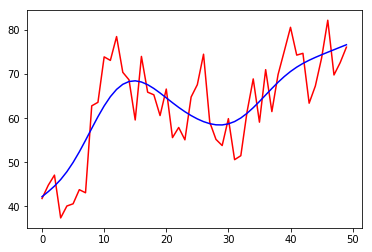

In [4]:
import scipy.signal as signal

#Ref. https://stackoverflow.com/questions/35588782/how-to-average-a-signal-to-remove-noise-with-python

# First, design the Buterworth filter, Moving average (low pass filter) 
N  = 3    # Filter order
Wn = 0.1 # Cutoff frequency
B, A = signal.butter(N, Wn, output='ba')
train_inputA = np.array(train_input[0, 0, :])
smooth_data = signal.filtfilt(B,A, train_inputA)
plt.plot(train_inputA,'r-')
plt.plot(smooth_data,'b-')
plt.show()

Fourier Analysis - Example plot
NOTE: Importance of normalization to keep the magnitude 

### Fourier Analysis - Our data 

# Preprocessing

Noise removed; Trend Removed; Offset translated; Normalized 

### A "0" Labelled signals

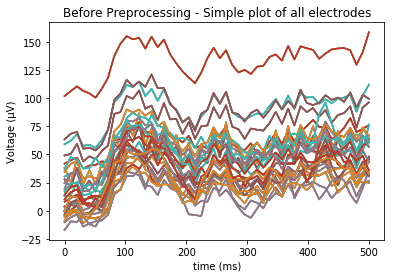

/Users/davidcleres/anaconda/envs/DeepLearning/lib/python3.6/site-packages/numpy/core/numeric.py:492: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


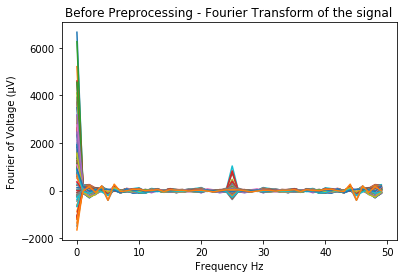

In [5]:
for i in range (0, len(train_input[0, :, 0])) :
    time = np.linspace(0, 500, 50)
    data = train_input[0, i, :]
    data = np.array(data)
    plt.plot(time, data)
    
    data1 = train_input[2, i, :]
    data1 = np.array(data)
    plt.plot(time, data1)
    
    data2 = train_input[4, i, :]
    data2 = np.array(data)
    plt.plot(time, data2)
    
    data3 = train_input[6, i, :]
    data3 = np.array(data)
    plt.plot(time, data3)
    
    plt.xlabel('time (ms)')
    plt.ylabel('Voltage (µV)')
    plt.title('Before Preprocessing - Simple plot of all electrodes') 
plt.show()  
        
for i in range (0, len(train_input[0, :, 0])) :
    data = train_input[0, i, :]
    data = np.array(data)
    fft=scipy.fft(data) #signal denoising 
    plt.plot(fft)
    
    
    data1 = train_input[2, i, :]
    data1 = np.array(data1)
    fft=scipy.fft(data1) #signal denoising 
    plt.plot(fft)
    
    data2 = train_input[4, i, :]
    data2 = np.array(data2)
    fft=scipy.fft(data2) #signal denoising 
    plt.plot(fft)
    
    data3 = train_input[6, i, :]
    data3 = np.array(data3)
    fft=scipy.fft(data3) #signal denoising 
    plt.plot(fft)
    
    plt.xlabel('Frequency Hz')
    plt.ylabel('Fourier of Voltage (µV)')
    plt.title('Before Preprocessing - Fourier Transform of the signal')
plt.show()

In [37]:
# GET THE RAW DATA AGAIN 
import matplotlib.pyplot as plt
import numpy as np 
from scipy import signal
import scipy
from scipy.signal import find_peaks_cwt

inputlen = np.array(train_input[0, :, 0]) 
time = np.linspace(0, 500, 50)

fig, axes = plt.subplots(nrows=28, ncols=2, sharex=True, figsize=(100, 100))
fig.subplots_adjust(hspace=0.5)

copy = np.array(train_target).copy()

idx0 = [i for i,x in enumerate(copy) if x == 0] 
idx1 = [i for i,x in enumerate(copy) if x == 1]

idx0 = idx0[0:10]
idx1 = idx1[0:10]

print(idx0)
print(idx1)

if(len(idx0) < len(idx1)):
    indexeslen = len(idx0)
else: 
    indexeslen = len(idx1)
    
print(indexeslen)

#input_len = nbChannels = 28 
#indexes_len = number of data of label "0" or "1" 
correlationArray = np.zeros((inputlen.size, indexeslen))

for i in range(0, indexeslen): 
    for k in range(0, inputlen.size):
   
        # Actual Preprocessing set 
        print(idx0[i])
        data0 = np.array(train_input)
        data0 = data0[idx0[i], k, :]

        fft=scipy.fft(data0) #signal denoising 
        bp=fft[:]
        for j in range(len(bp)): 
            if j>=10: #if frequency is higher then 10 Hz 
                bp[j]=0
        ibp=scipy.ifft(bp) 
        ibp = signal.detrend(ibp) #signal detrending
        #ibp = (ibp-ibp[0])/max(max(ibp), abs(min(ibp))) #signal normalization with initial offset suprresion 
        ibp = (ibp-np.mean(ibp))/np.std(ibp) #signal normalization with initial offset suprresion 

        axes[k, 0].plot(time, ibp)
        #axes[0, i].xlabel('time (ms)')
        #axes[0, i].ylabel('Normalized Voltage (-)')
        #plt.title('After Preprocessing - Simple plot of all electrodes')

        data1 = train_input[idx1[i], k, :]
        data1 = np.array(data1)

        fft=scipy.fft(data1) #signal denoising 
        bp=fft[:]
        for j in range(len(bp)): 
            if j>=10: #if frequency is higher then 10 Hz 
                bp[j]=0
        ibp=scipy.ifft(bp) 

        ibp = signal.detrend(ibp) #signal detrending

        #ibp = (ibp-ibp[0])/max(max(ibp), abs(min(ibp))) #signal normalization with initial offset suprresion 
        ibp = (ibp-np.mean(ibp))/np.std(ibp) #signal normalization with initial offset suprresion 

        axes[k, 1].plot(time, ibp)

        correlationArray[k, i] = np.correlate(data0, data1)
        #axes[1, i].xlabel('time (ms)')
        #axes[1, i].ylabel('Normalized Voltage (-)')
        #plt.title('After Preprocessing - Simple plot of all electrodes')
fig.tight_layout()
plt.show()

mean_correlation = np.mean(correlationArray, axis=1)
print(mean_correlation)

sorted_idx = np.argsort(np.abs(mean_correlation))
print(sorted_idx)

print('The channels with the greatest difference between left and rigth are, ', sorted_idx[0:10])

[0, 2, 4, 6, 8, 9, 12, 13, 17, 18]
[1, 3, 5, 7, 10, 11, 14, 15, 16, 19]
10
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


/Users/davidcleres/anaconda/envs/DeepLearning/lib/python3.6/site-packages/numpy/core/numeric.py:492: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
12
12
12
12
12
12
12
12
12
12
12
12
12
12
12
12
12
12
12
12
12
12
12
12
12
12
12
12
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
13
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18


[237274.36875      2129.3737793  145350.425       98956.30292969
  66882.62426758   8913.80275879   9594.72705078  -8973.37685852
 187798.23535156 217201.2984375  640720.05       -14752.03815918
 -19349.94594116 -16517.86080017   5236.96852417 -13648.52807617
 -22028.76428223 -24743.26357422 -15061.85881348  37964.70810547
  -7924.0536377    7100.22827148  -2509.16877441 154098.13217773
  13016.48183594  -7622.81721191  21648.75168457  -9844.68914795]
[ 1 22 14 21 25 20  5  7  6 27 24 15 11 18 13 12 26 16 17 19  4  3  2 23
  8  9  0 10]
The channels with the greatest difference between left and rigth are,  [ 1 22 14 21 25 20  5  7  6 27]


In [38]:
sorted_idx = np.argsort(np.abs(mean_correlation))
print(sorted_idx)

print('The channels with the greatest difference between left and rigth are, ', sorted_idx[0:10])

[ 1 22 14 21 25 20  5  7  6 27 24 15 11 18 13 12 26 16 17 19  4  3  2 23
  8  9  0 10]
The channels with the greatest difference between left and rigth are,  [ 1 22 14 21 25 20  5  7  6 27]
